## Import libraries

In [6]:
import pandas as pd
import matplotlib as plt

In [11]:
import pandas as pd
import seaborn as sns
import scipy.stats as st
import numpy as np
import plotly.graph_objects as go
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from scipy.spatial import cKDTree

from numpy.ma.core import ceil
from scipy.spatial import distance #distance calculation
from sklearn.preprocessing import MinMaxScaler #normalisation
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score #scoring
from sklearn.metrics import confusion_matrix
from matplotlib import animation, colors
from minisom import MiniSom
from scipy import integrate
from sklearn.metrics import r2_score
import sys
sys.path.insert(0, '../')

from minisom import MiniSom
from matplotlib.gridspec import GridSpec
%matplotlib inline
import random
from tqdm import tqdm
%load_ext autoreload
import scipy.stats as st

import warnings
from sklearn.preprocessing import StandardScaler
import numpy as np
from scipy.signal import savgol_filter
from lightgbm import LGBMClassifier  # Importer LGBMClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
warnings.filterwarnings('ignore')
from scipy.stats import skew
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.nonparametric.kernel_regression import KernelReg

import pysptools.spectro as pysp

ModuleNotFoundError: No module named 'plotly.graph_objects'

## Import données

In [23]:
uc = pd.read_csv(r'C:\Users\serdoun1\Desktop\Footprints\Data\Geology_Uc.csv')
centroids = pd.read_csv (r'C:\Users\serdoun1\Desktop\Footprints\Data\NGAM\Deposits\Barycenters.csv')
spectral_scalars = pd.read_csv (r'I:\Phd\Articles\Article_Footprints\Data\Processed_Scalars.csv')
spectral_scalars = spectral_scalars.loc[spectral_scalars['Area'] != 'Shea_Creek']
geochemistry = pd.read_csv (r'I:\Phd\Data\Geochemistry\GEOCHEMISTRY_RECENT.csv')
geochemistry_sst = geochemistry.loc[(geochemistry['SAMPLE_TYPE'] == 'COMP_S') | (geochemistry['SAMPLE_TYPE'] == 'POIN_S')]

gamma = pd.read_csv (r'C:\Users\serdoun1\Desktop\EDA_conducteurs\data\Drillholes_Point_log_all.csv')
gamma = gamma.rename(columns={'probing_ngam': 'NGAM'})
gamma = gamma.loc[gamma['NGAM'] > 0].iloc[:, :3]

gamma.columns = ['DEPTH', 'HOLEID', 'NGAM']

ngam_she = pd.read_csv (r'C:\Users\serdoun1\Desktop\Footprints\Data\NGAM\Geology_Probing_Natural_Gamma_SHE.csv')
ngam_she['HOLEID'] = ngam_she['HOLEID'].str.replace('SHEA', 'SHE')
ngam = pd.concat ([gamma, ngam_she], axis = 0, sort = False)

ngam = ngam.rename(columns={'HOLEID': 'HoleName'})
ngam = ngam.rename(columns={'DEPTH': 'Depth'})

ngam['HoleName'] = ngam['HoleName'].str.replace(r'-', '')
ngam['HoleName'] = ngam['HoleName'].str.replace(r'_', '')
ngam_spectral = ngam.merge (spectral_scalars, on = ['HoleName', 'Depth'], how = 'inner')

ngam_spectral

,Depth,HoleName,NGAM,PROJECTCODE,DEPTH.1,DEPTHSTEP,RUN,PRIORITY,CurveTypeFilter_D,Unnamed: 0.3,...,2390.0,2391.0,2392.0,2393.0,2394.0,2395.0,2396.0,2397.0,2398.0,2399.0
0,47.0,BENA30,23.720,NaN,NaN,NaN,NaN,NaN,NaN,76066,...,0.880771,0.889255,0.898968,0.909588,0.922050,0.935410,0.948484,0.964205,0.977450,0.990020
1,167.0,BENA30,85.500,NaN,NaN,NaN,NaN,NaN,NaN,76107,...,0.960513,0.958374,0.960758,0.964447,0.966345,0.967396,0.972872,0.979823,0.984890,0.992779
2,101.0,BENA30,15.940,NaN,NaN,NaN,NaN,NaN,NaN,76084,...,0.876979,0.889239,0.901503,0.913510,0.924406,0.935431,0.948467,0.961028,0.973114,0.988767
3,83.0,BENA30,55.000,NaN,NaN,NaN,NaN,NaN,NaN,76078,...,0.863818,0.877305,0.890502,0.903125,0.915452,0.927684,0.941815,0.956193,0.970185,0.987049
4,197.0,BENA30,51.420,NaN,NaN,NaN,NaN,NaN,NaN,76117,...,0.947326,0.960106,0.964253,0.959514,0.960161,0.957184,0.964595,0.981088,0.986146,0.989322
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111611,231.0,WL104,103.333,NaN,NaN,NaN,NaN,NaN,NaN,111368,...,0.896139,0.907109,0.918218,0.929097,0.940040,0.950983,0.960120,0.969689,0.980720,0.990812
111612,111.0,WL104,21.250,NaN,NaN,NaN,NaN,NaN,NaN,111328,...,0.876573,0.887831,0.900329,0.913502,0.925553,0.937194,0.949086,0.961929,0.975752,0.989191
111613,303.0,WL104,37.500,NaN,NaN,NaN,NaN,NaN,NaN,111392,...,0.895791,0.906213,0.916422,0.926462,0.937444,0.947699,0.957279,0.967749,0.978624,0.989316
111614,84.0,WL104,12.500,NaN,NaN,NaN,NaN,NaN,NaN,111319,...,0.868025,0.880369,0.893775,0.908969,0.922093,0.934464,0.947354,0.960306,0.974716,0.989088


## Séparation socle-bassin

In [51]:
lower_basin = []
upper_basement = []

slice = 200

holes = uc['HoleName'].unique().tolist()

for hole in tqdm(holes, desc="Processing holes"):
    hole_spectral = ngam_spectral.loc[(ngam_spectral['HoleName'] == str(hole))]
   
    hole_uc = np.min(uc.loc[uc['HoleName'] == str(hole)]['LOCATION_Z'])    

    lower_basin_ddh =  hole_spectral.loc[(hole_spectral['LOCATION_Z'] > hole_uc) & (hole_spectral['LOCATION_Z'] < hole_uc + slice)].to_numpy()
    upper_basement_ddh =  hole_spectral.loc[(hole_spectral['LOCATION_Z'] < hole_uc) & (hole_spectral['LOCATION_Z'] > hole_uc - slice)].to_numpy()

    lower_basin.append(lower_basin_ddh)
    upper_basement.append(upper_basement_ddh)

lower_basin = pd.DataFrame(np.vstack(lower_basin))
lower_basin.columns = ngam_spectral.columns
upper_basement = pd.DataFrame(np.vstack(upper_basement))
upper_basement.columns = ngam_spectral.columns



Processing holes: 100%|████████████████████████████████████████████████████████████| 6457/6457 [02:22<00:00, 45.19it/s]


## IR scalars by fault zones

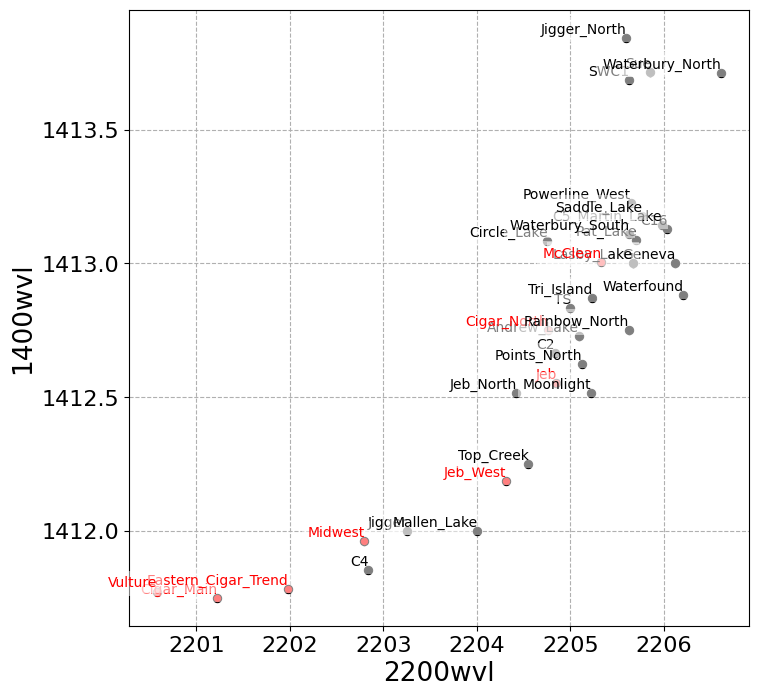

In [25]:
subset = lower_basin

white_micas = subset.loc[(subset['Min1 sTSAS'] == 'Muscovite') | (subset['Min1 sTSAS'] == 'Paragonite') | (subset['Min1 sTSAS'] == 'Paragoniticillite') | (subset['Min1 sTSAS'] == 'Muscoviticillite') | (subset['Min1 sTSAS'] == 'Phengite') |  (subset['Min1 sTSAS'] == 'Phengiticillite')]
white_micas = white_micas.loc[white_micas['Wt1 sTSAS'] > 0.95]
white_micas = white_micas.loc[white_micas['NGAM'] < 500]

kaolins = subset.loc[(subset['Min1 sTSAS'] == 'Dickite') | (subset['Min1 sTSAS'] == 'Nacrite') | (subset['Min1 sTSAS'] == 'Kaolinite-WX') | (subset['Min1 sTSAS'] == 'Kaolinite-PX')]
kaolins = kaolins.loc[kaolins['Wt1 sTSAS'] > 0.8]

chlorite = subset.loc[(subset['Min1 sTSAS'] == 'Chlorite-Mg') |(subset['Min1 sTSAS'] == 'Chlorite-Fe') | (subset['Min1 sTSAS'] == 'Chlorite-FeMg')]

subselection = white_micas

first = '2200wvl'
second = '1400wvl'
subset = pd.concat ([subselection.loc[:, '650D':'2250D/2350D'].astype(float), subselection['Area']], axis = 1, sort = False)
means = subset.groupby('Area')[[first, second]].mean()
east_areas = ['McClean', 'Jeb_North', 'Sue', 'TS', 'Midwest', 'Points_North', 'Waterfound', 'Cigar_Main', 'Eastern_Cigar_Trend', 
              'Cigar_North', 'Andrew_Lake', 'Jigger', 'Powerline_West', 'Jigger_North', 'Geneva', 'Lasby_Lake', 'Mallen_Lake', 'Moonlight', 
              'Top_Creek', 'Pat_Lake', 'Rainbow_North', 'Vulture', 'Waterbury_North', 'Waterbury_South','SWC1']
south_east_areas = ['West_C1', 'Tri_Island', 'Saddle_Lake', 'Circle_Lake', 'C17', 'C16', 'C5_Martin_Lake', 'C4', 'C2']  # Complétez avec les noms des aires pour le secteur 'South East'

prospective_areas = ['Shea_Creek', 'Midwest', 'Cigar_Main', 'Vulture', 'Jeb', 'Jeb_West', 'Eastern_Cigar_Trend', 'Cigar_North', 'McClean']

categories_colors = {
    'Prospective': 'red',
    'Local min.': 'blue',
    'Barren': 'k'
}

plt.figure(figsize=(8, 8))
plt.rc('axes', axisbelow=True)

for i, row in means.iterrows():
    color = categories_colors['Barren'] if i not in prospective_areas else ('red' if i in prospective_areas else 'blue')
    plt.scatter(row[first], row[second], color=color, linewidth = 0.75, edgecolor = 'k')
    plt.text(row[first] + 0.005, row[second] + 0.005, str(i), size=10, color=color, ha='right', va='bottom', bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

color_legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=category, markerfacecolor=color, markersize=10) for category, color in categories_colors.items()]

plt.xlabel(first, fontsize=19)
plt.ylabel(second, fontsize=19)
plt.grid(True, linestyle = 'dashed')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.show()


## IR scalars vs Natural Gamma

Processing of 650D (1/28)
Processing of 900D (2/28)
Processing of 1400D (3/28)
Processing of 1900D (4/28)
Processing of 2200D (5/28)
Processing of 2250D (6/28)
Processing of 2350D (7/28)
Processing of 650wvl (8/28)
Processing of 900wvl (9/28)
Processing of 1400wvl (10/28)
Processing of 1900wvl (11/28)
Processing of 2200wvl (12/28)
Processing of 2250wvl (13/28)
Processing of 2350wvl (14/28)
Processing of 650(as) (15/28)
Processing of 900(as) (16/28)
Processing of 1400(as) (17/28)
Processing of 1900(as) (18/28)
Processing of 2200(as) (19/28)
Processing of 2250(as) (20/28)
Processing of 2350(as) (21/28)
Processing of 650(A/D) (22/28)
Processing of 900(A/D) (23/28)
Processing of 1400(A/D) (24/28)
Processing of 1900(A/D) (25/28)
Processing of 2200(A/D) (26/28)
Processing of 2250(A/D) (27/28)
Processing of 2350(A/D) (28/28)


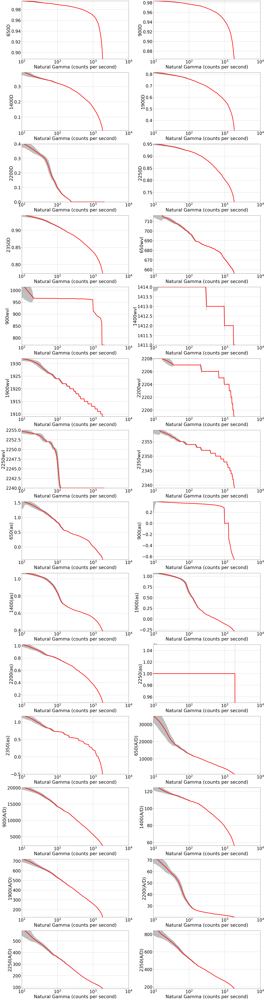

In [26]:
import numpy as np
import matplotlib.pyplot as plt
subset = white_micas
value = 'NGAM'

scalars_columns = lower_basin.loc[:, '650D':'2350(A/D)'].columns
taille_paquet = int(len(subset) * 0.01)  # 25% du total des données

nombre_variables = len(scalars_columns)
n_rows = int(np.ceil(nombre_variables / 2))
n_cols = 2 if nombre_variables > 1 else 1
fig, axes = plt.subplots(n_rows, n_cols, figsize=(13 * n_cols, 7 * n_rows), squeeze=False)

# Fonction pour calculer les moyennes et écarts-types mobiles
def moving_mean_std(values, window):
    means = []
    stds = []
    for start in range(len(values) - window + 1):
        window_values = values[start:start + window]
        means.append(window_values.mean())
        stds.append(window_values.std())
    return means, stds

for index, variable in enumerate(scalars_columns):
    print(f"Processing of {variable} ({index + 1}/{nombre_variables})")
    
    subset_sorted = subset.sort_values(by=variable, ascending=False)
    variable_values = subset_sorted[variable].astype(float)
    
    if len(variable_values) < taille_paquet:
        print(f"Attention : Pas assez de données pour former une fenêtre de taille {taille_paquet}.")
        continue
    
    # Calcul des percentiles Q1 et Q99 sur l'ensemble du jeu de données
    ymin, ymax = np.percentile(variable_values, [10, 99])
    
    means, stds = moving_mean_std(variable_values, taille_paquet)
    
    ax = axes[index // n_cols, index % n_cols]
    ax.plot(range(len(means)), means, color='r', label='Moyenne Mobile', linewidth = 4)
    ax.fill_between(range(len(means)), np.array(means) - np.array(stds), np.array(means) + np.array(stds), color='gray', alpha=0.5, label='Moyenne ±1 écart-type')
    
    ax.set_ylim(ymin, ymax)
    ax.set_ylabel(f'{variable}', fontsize=32)
    ax.set_xlabel('Natural Gamma (counts per second)', fontsize=32)
    ax.set_xscale('log')
    ax.set_xlim(10, 10000)
    ax.grid(True)

    # Mise à jour des labels des xticks et yticks
    ax.tick_params(axis='both', which='major', labelsize=30)

plt.tight_layout()
plt.show()


## Distances to barycenters

In [52]:
def calculate_distance(row, centroid):
    return np.sqrt((row['LOCATION_X'] - centroid['pondere_x'])**2 + 
                   (row['LOCATION_Y'] - centroid['pondere_y'])**2 + 
                   (row['LOCATION_Z'] - centroid['pondere_z'])**2)


distance_columns = []  
for i, centroid in centroids.iterrows():
    col_name = f'Distance_to_{centroid["Name"]}'  
    lower_basin[col_name] = lower_basin.apply(calculate_distance, axis=1, centroid=centroid)
    distance_columns.append(col_name)

lower_basin['Distance_to_Closest'] = lower_basin[distance_columns].min(axis=1)

distance_columns = []  
for i, centroid in centroids.iterrows():
    col_name = f'Distance_to_{centroid["Name"]}'  
    upper_basement[col_name] = upper_basement.apply(calculate_distance, axis=1, centroid=centroid)
    distance_columns.append(col_name)

upper_basement['Distance_to_Closest'] = upper_basement[distance_columns].min(axis=1)

distance_columns = []  
for i, centroid in centroids.iterrows():
    col_name = f'Distance_to_{centroid["Name"]}'  
    geochemistry_sst[col_name] = geochemistry_sst.apply(calculate_distance, axis=1, centroid=centroid)
    distance_columns.append(col_name)

geochemistry_sst['Distance_to_Closest'] = geochemistry_sst[distance_columns].min(axis=1)

####
def calculate_azimuth_and_dip(row, centroid):
    dX = row['LOCATION_X'] - centroid['pondere_x']
    dY = row['LOCATION_Y'] - centroid['pondere_y']
    dZ = row['LOCATION_Z'] - centroid['pondere_z']
    
    azimuth = np.degrees(np.arctan2(dY, dX))
    azimuth = (azimuth + 360) % 360 
    
    horizontal_distance = np.sqrt(dX**2 + dY**2)
    dip = np.degrees(np.arctan2(dZ, horizontal_distance))
    
    return azimuth, dip

for i, centroid in centroids.iterrows():
    azimuth_col_name = f'Azimuth_to_{centroid["Name"]}'
    dip_col_name = f'Dip_to_{centroid["Name"]}'

    results = lower_basin.apply(calculate_azimuth_and_dip, axis=1, centroid=centroid, result_type='expand')
    
    lower_basin[azimuth_col_name] = results[0]
    lower_basin[dip_col_name] = results[1]

lower_basin['Temp_Distance_to_Closest'] = np.inf
lower_basin['Azimuth_to_Closest'] = np.nan
lower_basin['Dip_to_Closest'] = np.nan

for i, centroid in centroids.iterrows():
    temp_results = lower_basin.apply(lambda row: calculate_azimuth_and_dip(row, centroid) + (np.sqrt((row['LOCATION_X'] - centroid['pondere_y'])**2 + (row['LOCATION_Y'] - centroid['pondere_y'])**2 + (row['LOCATION_Z'] - centroid['pondere_z'])**2),), axis=1, result_type='expand')
    temp_results.columns = ['Azimuth', 'Dip', 'Distance']
    
    is_closer = temp_results['Distance'] < lower_basin['Temp_Distance_to_Closest']
    lower_basin.loc[is_closer, 'Azimuth_to_Closest'] = temp_results.loc[is_closer, 'Azimuth']
    lower_basin.loc[is_closer, 'Dip_to_Closest'] = temp_results.loc[is_closer, 'Dip']
    lower_basin.loc[is_closer, 'Temp_Distance_to_Closest'] = temp_results.loc[is_closer, 'Distance']

lower_basin.drop(columns=['Temp_Distance_to_Closest'], inplace=True)

####

for i, centroid in centroids.iterrows():
    azimuth_col_name = f'Azimuth_to_{centroid["Name"]}'
    dip_col_name = f'Dip_to_{centroid["Name"]}'

    results = upper_basement.apply(calculate_azimuth_and_dip, axis=1, centroid=centroid, result_type='expand')
    
    upper_basement[azimuth_col_name] = results[0]
    upper_basement[dip_col_name] = results[1]

upper_basement['Temp_Distance_to_Closest'] = np.inf
upper_basement['Azimuth_to_Closest'] = np.nan
upper_basement['Dip_to_Closest'] = np.nan

for i, centroid in centroids.iterrows():
    temp_results = upper_basement.apply(lambda row: calculate_azimuth_and_dip(row, centroid) + (np.sqrt((row['LOCATION_X'] - centroid['pondere_x'])**2 + (row['LOCATION_Y'] - centroid['pondere_y'])**2 + (row['LOCATION_Z'] - centroid['pondere_z'])**2),), axis=1, result_type='expand')
    temp_results.columns = ['Azimuth', 'Dip', 'Distance']
    
    is_closer = temp_results['Distance'] < upper_basement['Temp_Distance_to_Closest']
    upper_basement.loc[is_closer, 'Azimuth_to_Closest'] = temp_results.loc[is_closer, 'Azimuth']
    upper_basement.loc[is_closer, 'Dip_to_Closest'] = temp_results.loc[is_closer, 'Dip']
    upper_basement.loc[is_closer, 'Temp_Distance_to_Closest'] = temp_results.loc[is_closer, 'Distance']

upper_basement.drop(columns=['Temp_Distance_to_Closest'], inplace=True)

####

for i, centroid in centroids.iterrows():
    azimuth_col_name = f'Azimuth_to_{centroid["Name"]}'
    dip_col_name = f'Dip_to_{centroid["Name"]}'

    results = geochemistry_sst.apply(calculate_azimuth_and_dip, axis=1, centroid=centroid, result_type='expand')
    
    geochemistry_sst[azimuth_col_name] = results[0]
    geochemistry_sst[dip_col_name] = results[1]

geochemistry_sst['Temp_Distance_to_Closest'] = np.inf
geochemistry_sst['Azimuth_to_Closest'] = np.nan
geochemistry_sst['Dip_to_Closest'] = np.nan

for i, centroid in centroids.iterrows():
    temp_results = geochemistry_sst.apply(lambda row: calculate_azimuth_and_dip(row, centroid) + (np.sqrt((row['LOCATION_X'] - centroid['pondere_x'])**2 + (row['LOCATION_Y'] - centroid['pondere_y'])**2 + (row['LOCATION_Z'] - centroid['pondere_z'])**2),), axis=1, result_type='expand')
    temp_results.columns = ['Azimuth', 'Dip', 'Distance']
    
    is_closer = temp_results['Distance'] < geochemistry_sst['Temp_Distance_to_Closest']
    geochemistry_sst.loc[is_closer, 'Azimuth_to_Closest'] = temp_results.loc[is_closer, 'Azimuth']
    geochemistry_sst.loc[is_closer, 'Dip_to_Closest'] = temp_results.loc[is_closer, 'Dip']
    geochemistry_sst.loc[is_closer, 'Temp_Distance_to_Closest'] = temp_results.loc[is_closer, 'Distance']

geochemistry_sst.drop(columns=['Temp_Distance_to_Closest'], inplace=True)


## Profils TSG par distance

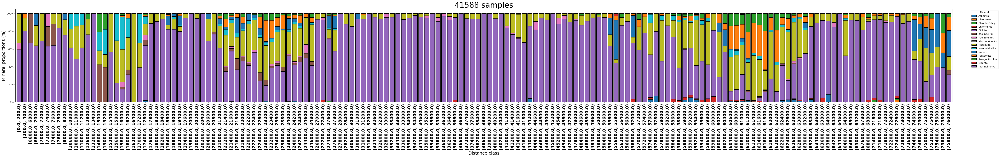

41588

In [86]:
deposit = 'Moonlight'

df = lower_basin.loc[lower_basin['Distance_to_' + deposit] < 90000]

df = df.loc[(df['Azimuth_to_Moonlight'] < 270) & (df['Azimuth_to_Moonlight'] > 180)]

df['Distance_bin'] = pd.cut(df['Distance_to_' + deposit],
                            bins=np.arange(0, df['Distance_to_' + deposit].max() + 200, 200), right=False)
count_minerals = df.groupby(['Distance_bin', 'Min1 sTSAS']).size().reset_index(name='count')

filtered_minerals = count_minerals[count_minerals['count'] >= 3]

total_per_bin = filtered_minerals.groupby('Distance_bin')['count'].sum().reset_index(name='total')

filtered_minerals = filtered_minerals.merge(total_per_bin, on='Distance_bin')
filtered_minerals['proportion'] = filtered_minerals['count'] / filtered_minerals['total']

pivot_df = filtered_minerals.pivot(index='Distance_bin', columns='Min1 sTSAS', values='proportion').fillna(0)

ax = pivot_df.plot(kind='bar', stacked=True, figsize=(70, 7),
                   edgecolor='black', linewidth=1.5, width=0.8)  

ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: '{:.0%}'.format(y)))

plt.title(str(len(df)) + ' samples', fontsize = 32)
plt.xlabel('Distance class', fontsize = 18 )
plt.ylabel('Mineral proportions (%)', fontsize = 18)

plt.legend(title='Minéral', bbox_to_anchor=(1.05, 1))
plt.xticks (fontsize = 18, weight = 'bold')
plt.show()

len(df)



## Profils spectraux par distance

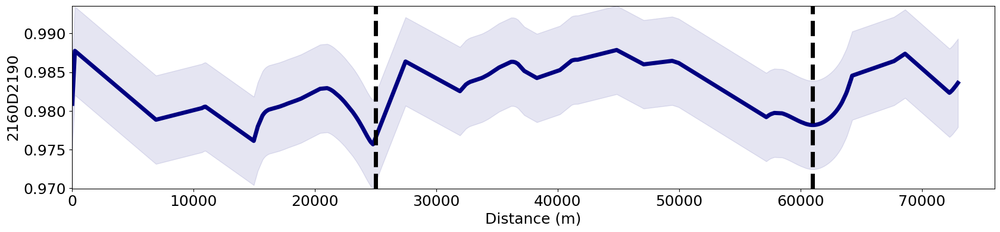

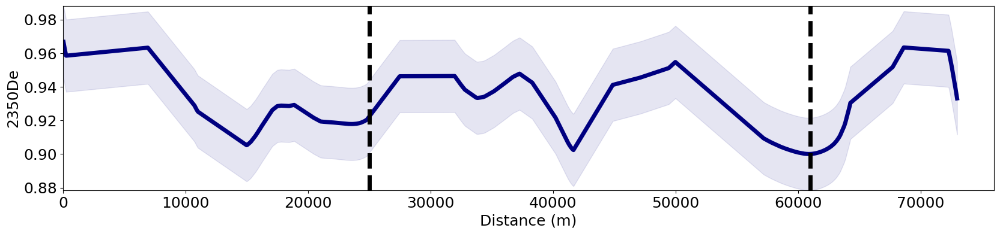

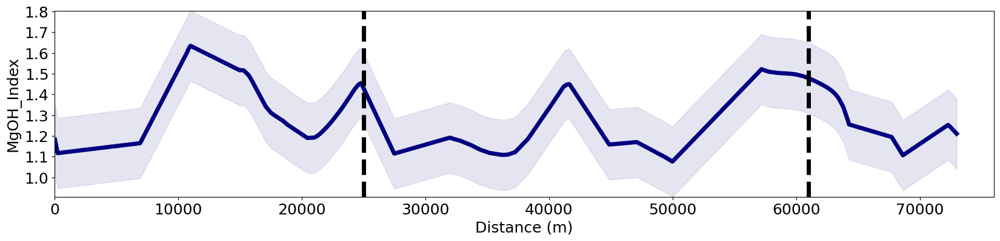

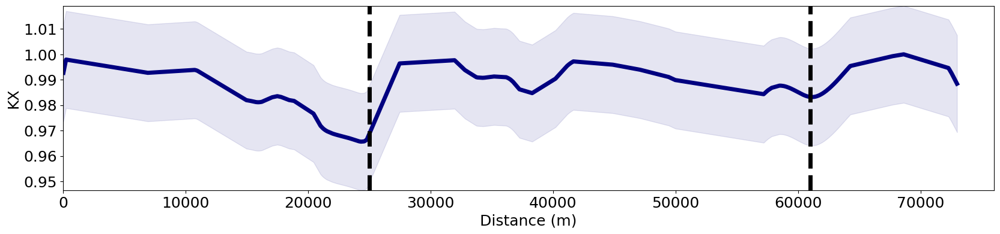

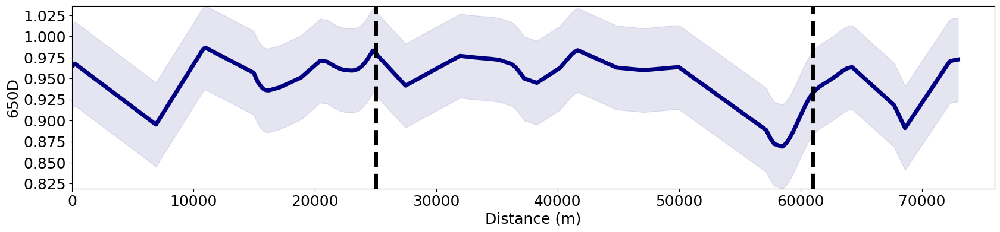

...

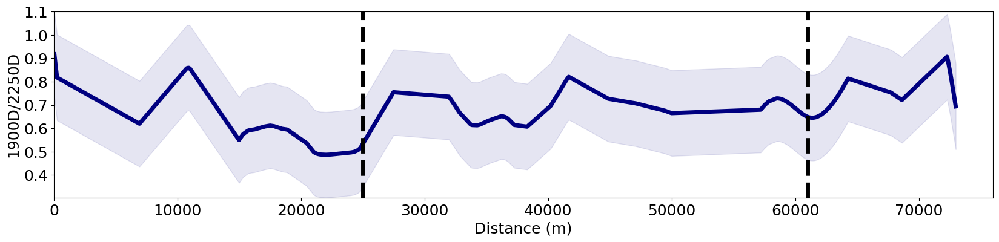

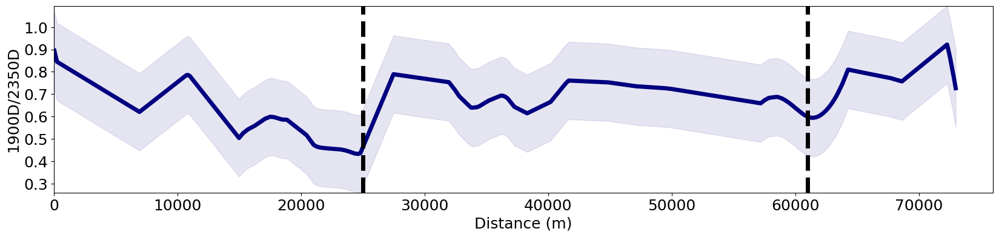

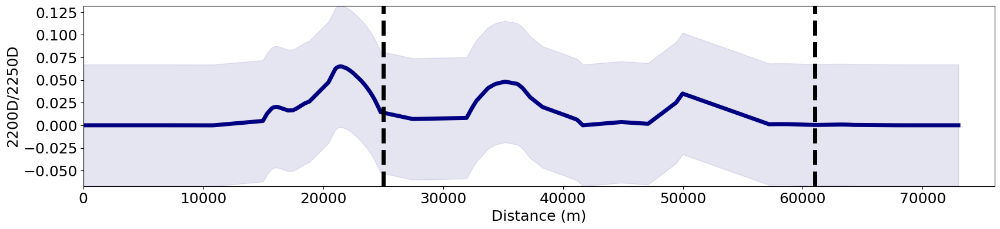

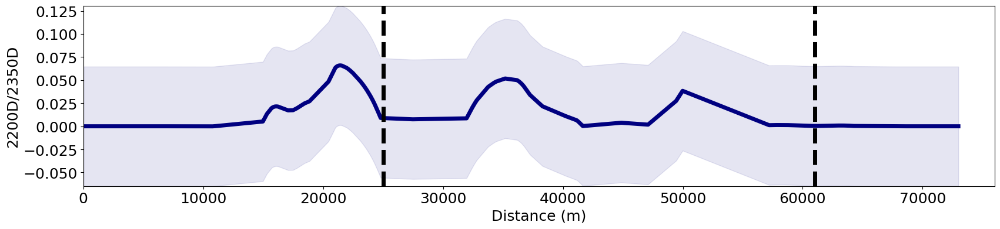

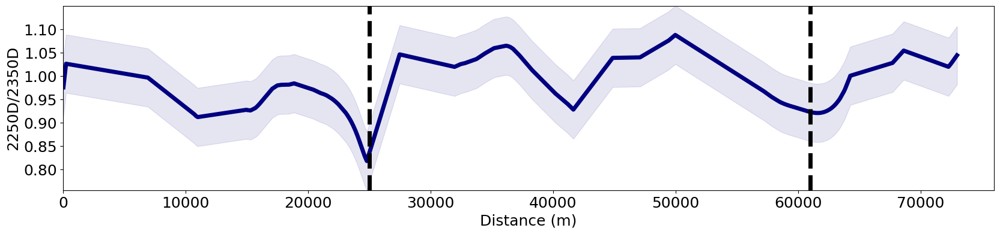

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.nonparametric.kernel_regression import KernelReg
subset = lower_basin
white_micas = subset.loc[(subset['Min1 sTSAS'] == 'Muscovite') | (subset['Min1 sTSAS'] == 'Paragonite') | (subset['Min1 sTSAS'] == 'Paragoniticillite') | (subset['Min1 sTSAS'] == 'Muscoviticillite') | (subset['Min1 sTSAS'] == 'Phengite') |  (subset['Min1 sTSAS'] == 'Phengiticillite')]
white_micas = white_micas.loc[white_micas['Wt1 sTSAS'] > 0.95]

kaolins = subset.loc[(subset['Min1 sTSAS'] == 'Dickite') | (subset['Min1 sTSAS'] == 'Nacrite') | (subset['Min1 sTSAS'] == 'Kaolinite-WX') | (subset['Min1 sTSAS'] == 'Kaolinite-PX')]
kaolins = kaolins.loc[kaolins['Wt1 sTSAS'] > 0.95]

max_distance = 80000
sites = ['Moonlight'] ## gisements pour lesquels on trace les courbes
information_columns = white_micas.loc[:, '2160D2190':'2250D/2350D'].columns ##colonnes d'intérêt
initial_subset = white_micas.loc[white_micas['2160D2190'] < 0.99]
initial_subset = initial_subset.loc[(initial_subset['Azimuth_to_Moonlight'] < 270) & (initial_subset['Azimuth_to_Moonlight'] > 180)]
colors = plt.cm.jet(np.linspace(0, 1, len(sites)))

for info_col in information_columns:
    plt.figure(figsize=(20, 4))
    min_vals, max_vals = [], []

    for site, color in zip(sites, colors):
        subset = initial_subset.loc[initial_subset[f'Distance_to_{site}'] < max_distance]
        distance_column = f'Distance_to_{site}'
        if not subset.empty:
            sorted_data = subset.sort_values(by=distance_column)
            distances = np.array(sorted_data[distance_column])
            values = np.array(sorted_data[info_col])

            distances = distances.flatten()
            values = values.flatten()

            bw_fixed = [np.std(distances) * len(distances) ** (-1 / 5.0)]
            kr = KernelReg(endog=values, exog=distances, var_type='c', reg_type='ll', bw=[1200])
            mean, _ = kr.fit(distances)

            residuals = values - mean
            estimated_std = np.std(residuals)

            if len(mean) > 0:
                min_vals.extend(mean - estimated_std)
                max_vals.extend(mean + estimated_std)

                plt.plot(distances, mean, color=color, linewidth=5)
                
                plt.fill_between(distances, mean - estimated_std, mean + estimated_std, color=color, alpha=0.1)

    if min_vals and max_vals:
        plt.ylim(min(min_vals), max(max_vals))

    plt.yticks (fontsize =18)
    plt.xticks (fontsize = 18)
    plt.xlabel('Distance')
    plt.vlines(ymin=min(min_vals), ymax=max(max_vals), x=61000, linestyle='dashed', color='black', linewidth=5)
    plt.vlines(ymin=min(min_vals), ymax=max(max_vals), x=25000, linestyle='dashed', color='black', linewidth=5)

    plt.xlim(0, 76000)
    plt.xlabel('Distance (m)', fontsize=18)
    plt.ylabel(info_col, fontsize=18)
    plt.show()

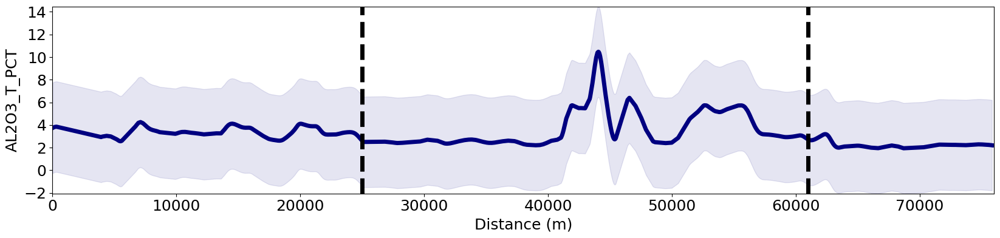

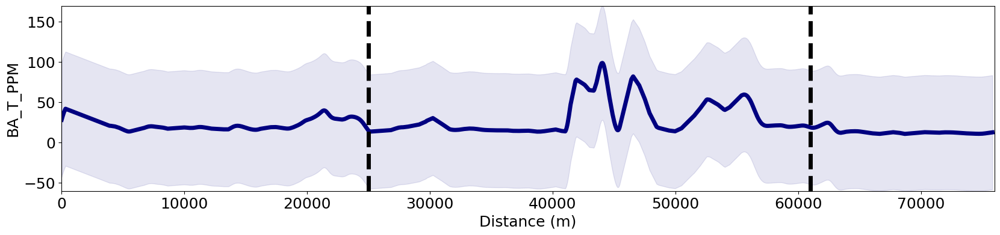

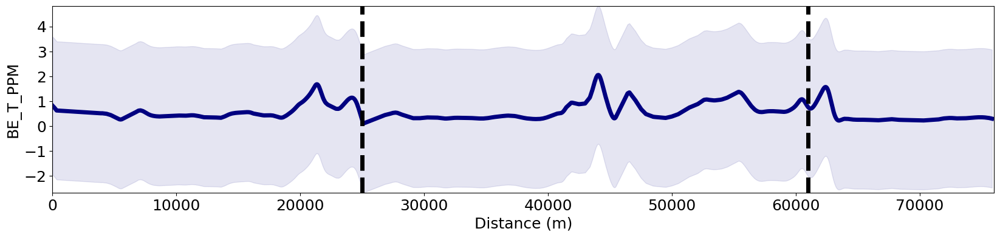

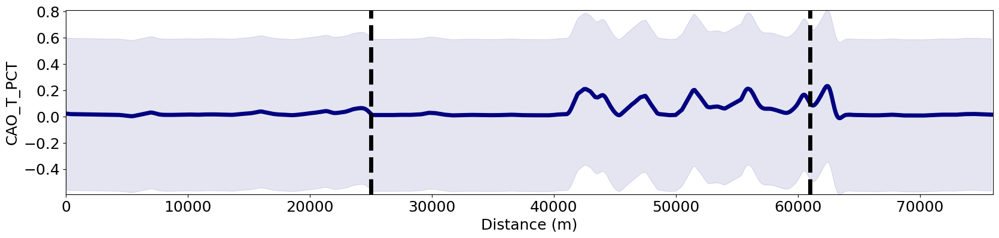

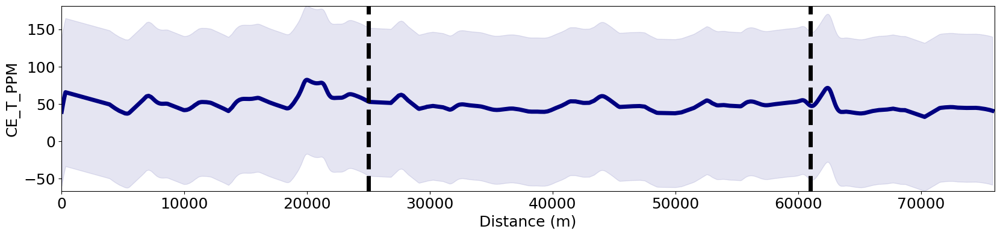

...

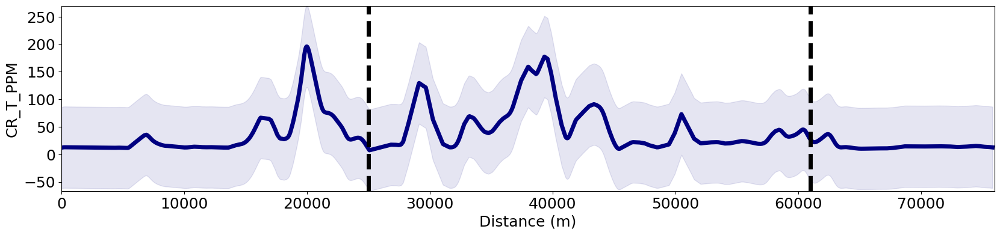

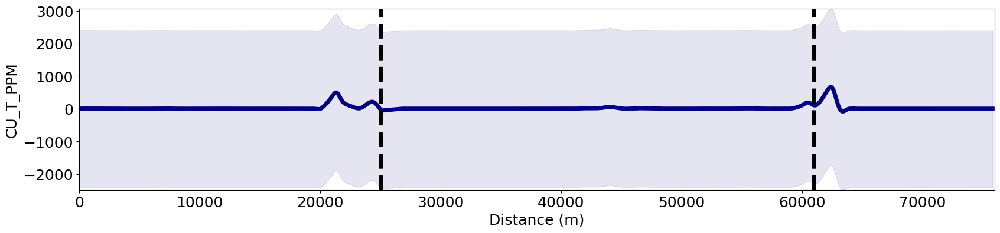

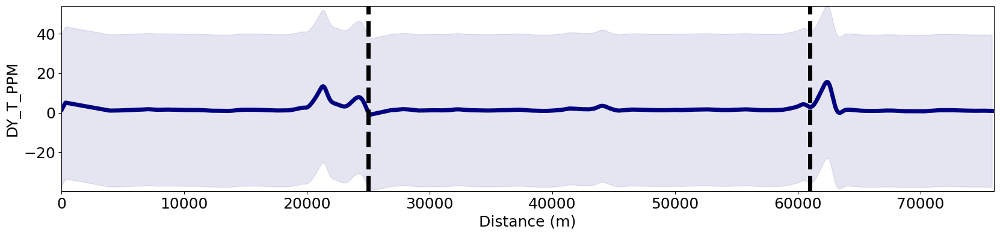

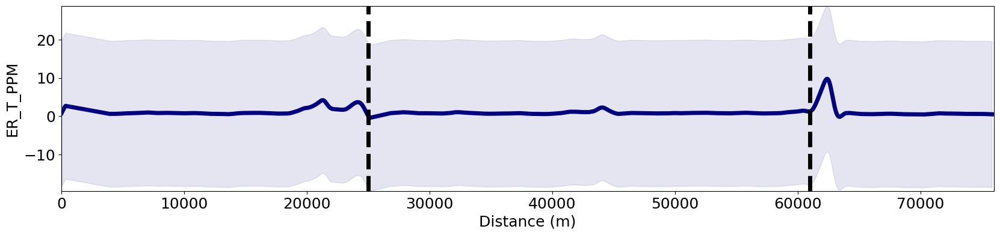

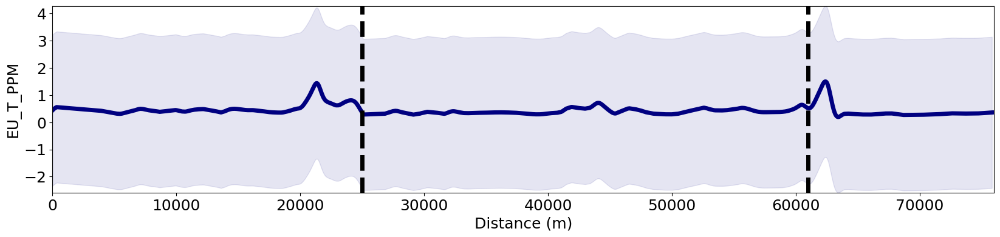

KeyboardInterrupt: 

<Figure size 2000x400 with 0 Axes>

In [13]:
subset = geochemistry_sst

max_distance = 80000
sites = ['Moonlight'] ## gisements pour lesquels on trace les courbes
information_columns = geochemistry_sst.loc[:, 'AL2O3_T_PCT':'ZR_T_PPM'].columns ##colonnes d'intérêt
information_columns = [chaine for chaine in information_columns if "_P_" not in chaine]
information_columns = [chaine for chaine in information_columns if "K2O_T_PCT" not in chaine]

initial_subset = subset
initial_subset = initial_subset.loc[(initial_subset['Azimuth_to_Moonlight'] < 90) & (initial_subset['Azimuth_to_Moonlight'] > 0)]
colors = plt.cm.jet(np.linspace(0, 1, len(sites)))

for info_col in information_columns:
    plt.figure(figsize=(20, 4))
    min_vals, max_vals = [], []

    for site, color in zip(sites, colors):
        subset = initial_subset.loc[initial_subset[f'Distance_to_{site}'] < max_distance]
        distance_column = f'Distance_to_{site}'
        if not subset.empty:
            sorted_data = subset.sort_values(by=distance_column)
            distances = np.array(sorted_data[distance_column])
            values = np.array(sorted_data[info_col])

            distances = distances.flatten()
            values = values.flatten()

            bw_fixed = [np.std(distances) * len(distances) ** (-1 / 5.0)]
            kr = KernelReg(endog=values, exog=distances, var_type='c', reg_type='ll', bw=[500])
            mean, _ = kr.fit(distances)

            residuals = values - mean
            estimated_std = np.std(residuals)

            if len(mean) > 0:
                min_vals.extend(mean - estimated_std)
                max_vals.extend(mean + estimated_std)

                plt.plot(distances, mean, color=color, linewidth=5)
                
                plt.fill_between(distances, mean - estimated_std, mean + estimated_std, color=color, alpha=0.1)

    if min_vals and max_vals:
        plt.ylim(min(min_vals), max(max_vals))

    plt.yticks (fontsize =18)
    plt.xticks (fontsize = 18)
    plt.xlabel('Distance')
    plt.vlines(ymin=min(min_vals), ymax=max(max_vals), x=61000, linestyle='dashed', color='black', linewidth=5)
    plt.vlines(ymin=min(min_vals), ymax=max(max_vals), x=25000, linestyle='dashed', color='black', linewidth=5)

    plt.xlim(0, 76000)
    plt.xlabel('Distance (m)', fontsize=18)
    plt.ylabel(info_col, fontsize=18)
    plt.show()
    

## Structures vs alteration

['650D', '900D', '1400D', '1900D', '2200D', '2250D', '2350D', '650wvl', '900wvl', '1400wvl', '1900wvl', '2200wvl', '2250wvl', '2350wvl', '650(as)', '900(as)', '1400(as)', '1900(as)', '2200(as)', '2250(as)', '2350(as)', '650(A/D)', '900(A/D)', '1400(A/D)', '1900(A/D)', '2200(A/D)', '2250(A/D)', '2350(A/D)', '650D/900D', '650D/1400D', '650D/1900D', '650D/2200D', '650D/2250D', '650D/2350D', '900D/1400D', '900D/1900D', '900D/2200D', '900D/2250D', '900D/2350D', '1400D/1900D', '1400D/2200D', '1400D/2250D', '1400D/2350D', '1900D/2200D', '1900D/2250D', '1900D/2350D', '2200D/2250D', '2200D/2350D', '2250D/2350D']


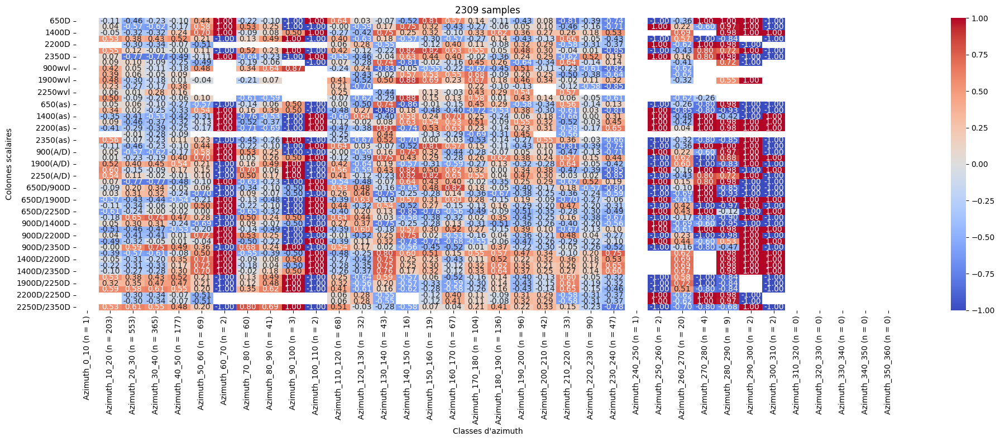

In [81]:
filtered_lower_basin = lower_basin
filtered_lower_basin = lower_basin.loc[lower_basin['Dip_to_Closest'] < 80]
min = 0
threshold = 500
deposit = 'Midwest_A'
filtered_lower_basin = filtered_lower_basin.loc[filtered_lower_basin['2160D2190'] <0.99]
filtered_lower_basin = filtered_lower_basin.loc[(filtered_lower_basin['Distance_to_'+str(deposit)] < threshold)]
filtered_lower_basin = filtered_lower_basin.loc[(filtered_lower_basin['Distance_to_' + str(deposit)] > min)]
scalar_columns = filtered_lower_basin.loc[:, '650D':'2250D/2350D'].columns.tolist()
print(scalar_columns)

azimuth_classes = [(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 60), (60, 70), (70, 80), (80, 90), (90, 100), (100, 110), (110, 120), 
                   (120, 130), (130, 140), (140, 150), (150, 160), (160, 170), (170, 180), (180, 190), (190, 200), (200, 210), (210, 220), 
                   (220, 230), (230, 240), (240, 250), (250, 260), (260, 270), (270, 280), (280, 290), (290, 300), (300, 310), (310, 320), 
                   (320, 330), (330, 340), (340, 350), (350, 360)]
                   
correlation_results = pd.DataFrame(index=scalar_columns)

class_labels_with_counts = []
sample_counts = []  

for (start, end) in azimuth_classes:
    azimuth_subset = filtered_lower_basin[(filtered_lower_basin['Azimuth_to_' + deposit] >= start) & (filtered_lower_basin['Azimuth_to_' + deposit] < end)]
    sample_count = len(azimuth_subset)
    sample_counts.append(sample_count)  
    class_labels_with_counts.append(f'Azimuth_{start}_{end} (n = {sample_count})')

for i, (start, end) in enumerate(azimuth_classes):
    class_label = class_labels_with_counts[i]
    azimuth_subset = filtered_lower_basin[(filtered_lower_basin['Azimuth_to_' + deposit] >= start) & (filtered_lower_basin['Azimuth_to_' + deposit] < end)]
    
    for col in scalar_columns:
        if azimuth_subset.empty:
            correlation_results.loc[col, class_label] = np.nan
        else:
            correlation_results.loc[col, class_label] = azimuth_subset[['Distance_to_' + deposit, col]].corr(method='spearman').iloc[0, 1]

plt.figure(figsize=(20, 8))
sns.heatmap(correlation_results.astype(float), annot=True, cmap='coolwarm', fmt=".2f")
plt.title(f'{len(filtered_lower_basin)} samples')
plt.xlabel('Classes d\'azimuth')
plt.ylabel('Colonnes scalaires')
plt.tight_layout()
plt.show()


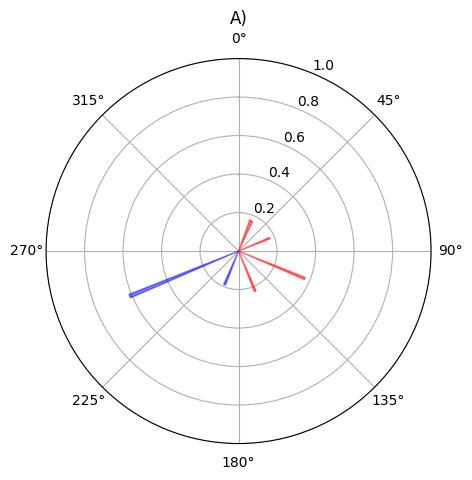

In [85]:
df_stereo = filtered_lower_basin

azimuth_classes = [(i, i + 45) for i in range(0, 360, 45)]

import numpy as np
import matplotlib.pyplot as plt

def calculate_correlations(df):
    correlation_results = []
    for start, end in azimuth_classes:
        azimuth_subset = df[(df['Azimuth_to_' + deposit] >= start) & (df['Azimuth_to_' + deposit] < end)]
        sample_count = len(azimuth_subset)
        if not azimuth_subset.empty:
            correlation = azimuth_subset[['Distance_to_' + deposit, '2200wvl']].corr(method='pearson').iloc[0, 1]
        else:
            correlation = np.nan
        correlation_results.append({'Start': start, 'End': end, 'Correlation': correlation, 'Sample_Count': sample_count})
    return pd.DataFrame(correlation_results)

correlation_results = calculate_correlations(df_stereo)

fig, ax = plt.subplots(figsize=(5, 5), subplot_kw={'projection': 'polar'})
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_ylim(0, 1)  

max_samples = correlation_results['Sample_Count'].max()

for index, row in correlation_results.iterrows():
    azimuth_mid = (row['Start'] + row['End']) / 2
    azimuth_rad = np.deg2rad(azimuth_mid)
    color = 'red' if row['Correlation'] > 0 else 'blue'
    
    normalized_samples = row['Sample_Count'] / max_samples
    transformed_width = normalized_samples ** 0.5 * 0.1 
    length = 0.1 + np.abs(row['Correlation']) * 0.9  
    width = transformed_width 
    
    ax.arrow(azimuth_rad, 0, 0, length, alpha=0.5, width=width,
             color=color, length_includes_head=True, head_width=0, head_length=0)

plt.title('A)')
plt.show()

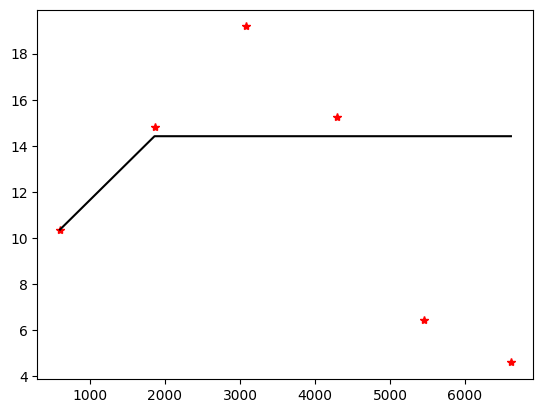

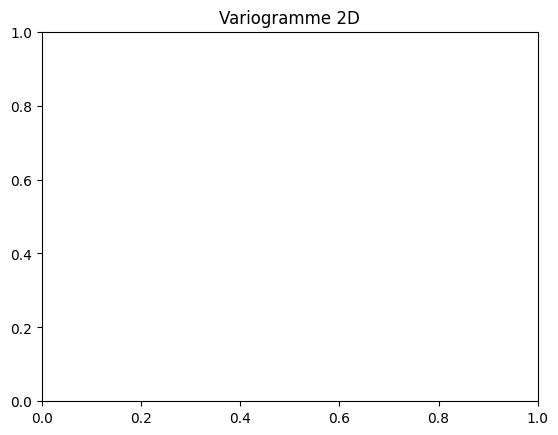

In [75]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pykrige.ok import OrdinaryKriging

dataset = lower_basin.loc[lower_basin['Distance_to_Cigar_Main'] < 4000]
coordinates_3d = dataset[['LOCATION_X', 'LOCATION_Y', 'LOCATION_Z']].values
values = dataset['2200wvl'].values

coordinates_2d = dataset[['LOCATION_X', 'LOCATION_Y']].values

OK2D = OrdinaryKriging(
    coordinates_2d[:, 0], 
    coordinates_2d[:, 1], 
    values, 
    variogram_model='spherical',
    verbose=False,
    enable_plotting=False
)

OK2D.display_variogram_model()
plt.title("Variogramme 2D")
plt.show()

